In [22]:
from pyCRLD.Environments.RiskReward import RiskReward


import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Standard library imports
import os
import math
import itertools as it
import tempfile
import warnings
import pickle



# Project-specific imports
from pyCRLD.Agents.StrategyActorCritic import stratAC
from pyCRLD.Agents.StrategySARSA import stratSARSA
from pyCRLD.Environments.SocialDilemma import SocialDilemma



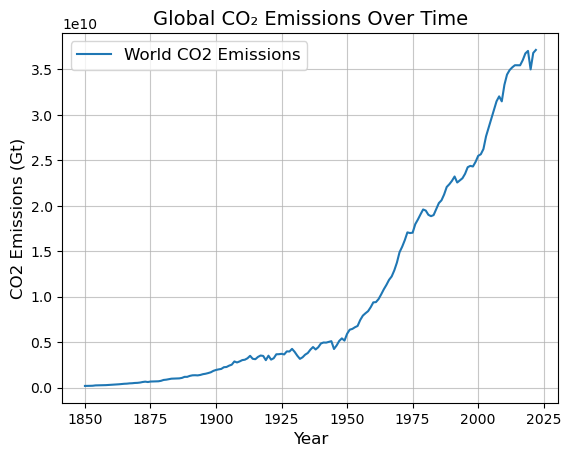

In [23]:
# Reading local data (its downloaded on local storage)
data = pd.read_csv("co2.csv")

# Filtering out the data related to the world
world_co2_df = data[data["Entity"] == 'World'][['Year','Annual CO₂ emissions']]
# Create a list 
world_co2_list = world_co2_df.values.tolist() 
# Create a numpy array 
world_co2_array =  np.array(world_co2_list)
co2_emissions = world_co2_array[100:]

# Plotting
plt.plot(co2_emissions[:,0], co2_emissions[:,1], label='World CO2 Emissions')

# Axes Labels
plt.xlabel("Year", fontsize=12)
plt.ylabel("CO2 Emissions (Gt)", fontsize=12)

# Title
plt.title("Global CO₂ Emissions Over Time", fontsize=14)

# Grid and Legend
plt.grid(True, alpha=0.7)  # Adjusting grid visibility
plt.legend(fontsize='large')

# Show Plot
plt.show()

# Fit to the data manualy

In [24]:
from ax.service.ax_client import AxClient, ObjectiveProperties
from ax.utils.measurement.synthetic_functions import hartmann6
from ax.utils.notebook.plotting import init_notebook_plotting, render

In [25]:
def evaluation_function(params):
    # Collapse probability when risky in prosperous
    # Recovery probability when cautious in degraded
    # Reward for staying prosperous and cautious
    # Reward for staying prosperous but risky
    # Reward when in degraded state
    
    # Initialize environment and interface
    
    pc = params.get("pc")
    pr = params.get("pr")
    rs = params.get("rs")
    rr = params.get("rr")
    rd = params.get("rd")
    learning_rate = params.get("learning_rate")
    discount_factor = params.get("discount_factor")
    c = params.get("c")
   
    env = RiskReward(pc, pr, rs, rr, rd)
    mae = stratAC(env=env, learning_rates=learning_rate, discount_factors=discount_factor)
    x = np.array(mae.random_softmax_strategy())
    xc= .999
    
    x[0, 0, 0] = xc  # from a random initial strategy
    x[0, 0, 1] = 1-xc
    
    xtraj, fixedpointreached = mae.trajectory(x, Tmax=173)

    
    output = np.array(c*1e10*(xtraj[:,0,0,1]))
    

    if len(output) < len(co2_emissions[:,1]):
            output = np.zeros(len(co2_emissions[:,1]))
    error = np.sum(np.square(output - co2_emissions[:,1]))
    return {"error":(error,0.0)}

In [26]:

ax_client = AxClient() # define a new client
Agent="AC"


# define parameters boundaries
ax_client.create_experiment(
    name = "AX",
    parameters = [
        {
            "name": "learning_rate",
            "type": "range",
            "bounds": [0.001, 1.0],
            "value_type": "float"


        },
        {
            "name": "discount_factor",
            "type": "range",
            "bounds": [0.01, 0.99],
            "value_type": "float"
        },
        {
            "name": "pc",
            "type": "range",
            "bounds": [0, 1.0],
            "value_type": "float"
        },
        {
            "name": "pr",
            "type": "range",
            "bounds": [0, 1.0],
            "value_type": "float"
        },
        {
            "name": "c",
            "type": "range",
            "bounds": [1.0, 9.0],
            "value_type": "float"
        },
        {
            "name": "rs",
            "type": "range",
            "bounds": [0, 1.0],
            "value_type": "float"
        },
        {
            "name": "rr",
            "type": "range",
            "bounds": [0, 1.0],
            "value_type": "float"

        },
        
        {
            "name": "rd",
            "type": "fixed",
            "value": 0,
            "value_type": "float"

        }

    ],

    objectives = {"error":ObjectiveProperties(minimize=True)},
    parameter_constraints= ["rr >= rs"]
    

)

[INFO 11-26 14:12:41] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[INFO 11-26 14:12:41] ax.service.utils.instantiation: Created search space: SearchSpace(parameters=[RangeParameter(name='learning_rate', parameter_type=FLOAT, range=[0.001, 1.0]), RangeParameter(name='discount_factor', parameter_type=FLOAT, range=[0.01, 0.99]), RangeParameter(name='pc', parameter_type=FLOAT, range=[0.0, 1.0]), RangeParameter(name='pr', parameter_type=FLOAT, range=[0.0, 1.0]), RangeParameter(name='c', parameter_type=FLOAT, range=[1.0, 9.0]), RangeParameter(name='rs', parameter_type=FLOAT, range=[0.0, 1.0]), RangeParameter(name='rr', parameter_type=FLOAT, range=[0.0, 1.0]), FixedParameter(name='rd', parameter_type=FLOAT, value=0.0)], parameter_constraints=[OrderConstraint(rs <= rr)]).
[INFO 11-26 14:12:41] ax.modelbridge.dispatch_utils: Using Models.BO

In [27]:
iterations = 500
for i in range(iterations):
    parameterization, trial_index = ax_client.get_next_trial()
    # Local evaluation here can be replaced with deployment to external system.
    ax_client.complete_trial(trial_index=trial_index, raw_data=evaluation_function(parameterization))

/home/ali/anaconda3/lib/python3.12/site-packages/ax/modelbridge/cross_validation.py:463: UserWarning:

Encountered exception in computing model fit quality: RandomModelBridge does not support prediction.

[INFO 11-26 14:12:41] ax.service.ax_client: Generated new trial 0 with parameters {'learning_rate': 0.224685, 'discount_factor': 0.079755, 'pc': 0.571705, 'pr': 0.712355, 'c': 8.722341, 'rs': 0.009542, 'rr': 0.963786, 'rd': 0.0} using model Sobol.
[INFO 11-26 14:12:41] ax.service.ax_client: Completed trial 0 with data: {'error': (3.9772966799797184e+23, 0.0)}.
/home/ali/anaconda3/lib/python3.12/site-packages/ax/modelbridge/cross_validation.py:463: UserWarning:

Encountered exception in computing model fit quality: RandomModelBridge does not support prediction.

[INFO 11-26 14:12:41] ax.service.ax_client: Generated new trial 1 with parameters {'learning_rate': 0.423903, 'discount_factor': 0.444004, 'pc': 0.223581, 'pr': 0.014468, 'c': 6.040304, 'rs': 0.244228, 'rr': 0.679303, 'rd': 0.0

In [38]:
# extract all the reults
df = ax_client.generation_strategy.trials_as_df

# print all the results 
print(df)

[INFO 11-26 16:47:19] ax.modelbridge.generation_strategy: Note that parameter values in dataframe are rounded to 2 decimal points; the values in the dataframe are thus not the exact ones suggested by Ax in trials.


        Generation Step Generation Model(s)  Trial Index Trial Status  \
0    [GenerationStep_0]             [Sobol]            0    COMPLETED   
1    [GenerationStep_0]             [Sobol]            1    COMPLETED   
2    [GenerationStep_0]             [Sobol]            2    COMPLETED   
3    [GenerationStep_0]             [Sobol]            3    COMPLETED   
4    [GenerationStep_0]             [Sobol]            4    COMPLETED   
..                  ...                 ...          ...          ...   
495  [GenerationStep_1]           [BoTorch]          495    COMPLETED   
496  [GenerationStep_1]           [BoTorch]          496    COMPLETED   
497  [GenerationStep_1]           [BoTorch]          497    COMPLETED   
498  [GenerationStep_1]           [BoTorch]          498    COMPLETED   
499  [GenerationStep_1]           [BoTorch]          499    COMPLETED   

                                 Arm Parameterizations  
0    {'0_0': {'learning_rate': 0.22, 'discount_fact...  
1    {'1_

In [29]:
parameters = df["Arm Parameterizations"]

In [30]:
def model_plot_3(params):
    
    pc = params.get("pc")
    pr = params.get("pr")
    rs = params.get("rs")
    rr = params.get("rr")
    rd = params.get("rd")
    learning_rate = params.get("learning_rate")
    discount_factor = params.get("discount_factor")
    c = params.get("c")
    xc = 0.999
    # Initialize environment and interface
    env = RiskReward(pc, pr, rs, rr, rd)
    mae = stratAC(env=env, learning_rates=learning_rate, discount_factors=discount_factor)
    x = np.array(mae.random_softmax_strategy())

    
    x[0, 0, 0] = xc  # from a random initial strategy
    x[0, 0, 1] = 1-xc
    
    xtraj, fixedpointreached = mae.trajectory(x, Tmax=173)

    
    return c*1e10*np.array((xtraj[:,0,0,1]))

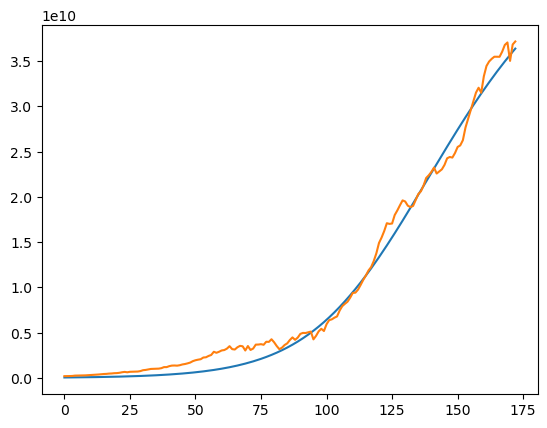

In [31]:
# Extracting the best result
params, values = ax_client.get_best_parameters()# Unpack the parameters by name
params
data = model_plot_3(params)
plt.plot(data)
plt.plot(co2_emissions[:,1])


In [49]:
params

{'learning_rate': 0.5023409448674276,
 'discount_factor': 0.4537721210590728,
 'pc': 0.8143305764421065,
 'pr': 0.027085357768432575,
 'c': 5.009929918703027,
 'rs': 0.04797974096242258,
 'rr': 0.9759481432037304,
 'rd': 0.0}

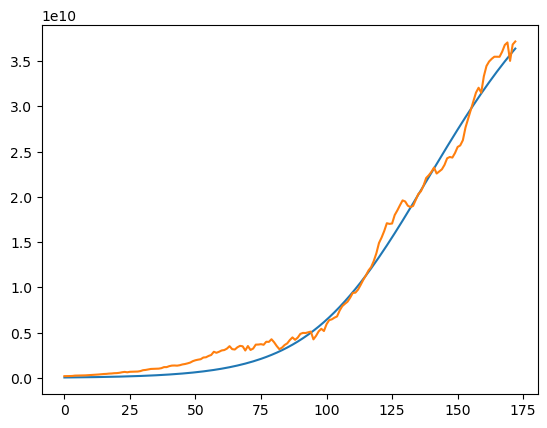

In [88]:
params
params_copy = params.copy()

params_copy["learning_rate"] = 0.5023409448674276
params_copy["discount_factor"] = 0.4537721210590728
params_copy["pc"] = 0.8143305764421065
params_copy["pr"] = 0.027085357768432575
params_copy["rs"] = 0.04797974096242258
params_copy["rr"] = 0.9759481432037304
params_copy["rd"] = 0






data = model_plot_3(params_copy)
plt.plot(data)
plt.plot(co2_emissions[:,1])

In [33]:
render(
    ax_client.get_optimization_trace())

In [34]:
from ax.modelbridge.cross_validation import cross_validate
from ax.plot.contour import interact_contour
from ax.plot.diagnostic import interact_cross_validation
from ax.plot.scatter import interact_fitted, plot_objective_vs_constraints, tile_fitted
from ax.plot.slice import plot_slice
from ax.service.ax_client import AxClient, ObjectiveProperties
from ax.utils.measurement.synthetic_functions import hartmann6
from ax.utils.notebook.plotting import init_notebook_plotting, render

In [35]:
model = ax_client.generation_strategy.model
render(interact_contour(model=model, metric_name="error"))

In [36]:
cv_results = cross_validate(model)
render(interact_cross_validation(cv_results))

In [37]:
render(plot_slice(model, "learning_rate", "error"))

# 